

# Deteksi Penyakit Kacang-kacangan, Stroberi dan Tomat Menggunakan YOLOv11

**Farhan Abdullah Yunus**

**Fakultas Informatika, Universitas Telkom, Bandung**

**farhanabdullah@student.telkomuniversity.ac.id**


# Import Library

In [ ]:
#@title Import
import ultralytics
from roboflow import Roboflow
import yaml
import torch
from ultralytics import YOLO

In [ ]:
#@title Ultralytics Version

ultralytics.checks()

Ultralytics 8.3.49 🚀 Python-3.12.8 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
Setup complete ✅ (12 CPUs, 11.7 GB RAM, 83.2/1006.9 GB disk)


In [ ]:
#@title Check Pytorch

# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print(f"CUDA Available: {cuda_available}")

# CUDA version
if cuda_available:
    cuda_version = torch.version.cuda
    print(f"CUDA Version: {cuda_version}")

# cuDNN version
cudnn_version = torch.backends.cudnn.version()
print(f"cuDNN Version: {cudnn_version}")

CUDA Available: True
CUDA Version: 12.4
cuDNN Version: 90100


# Dataset

## Description
Beans, Strawberry and Tomato diseases
## Source
- https://universe.roboflow.com/artificial-intelligence-82oex/detecting-diseases
## Classes

#### Strawberry
- Angular Leafspot
- Anthracnose Fruit Rot
- Blossom Blight
- Gray Mold
- Leaf Spot
- Powdery Mildew Fruit
- Powdery Mildew Leaf

#### Tomato
- Disease
- Leaf Mold
- Spider Mites

#### Bean
- ALS
- Bean Rust

In [ ]:
#@title Load dataset

rf = Roboflow(api_key="NFACG7gKBTunlf3HY0DO")
project = rf.workspace("farhan-abdullah-yunus").project("detecting-diseases-f6j4d")
version = project.version(3)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
#@title Change path in .yaml file

# Path to your data.yaml file
yaml_file = f'{dataset.location}/data.yaml'

# New paths for train, val, and test
new_train_path = f'{dataset.location}/train/images'
new_val_path = f'{dataset.location}/valid/images'
new_test_path = f'{dataset.location}/test/images'

# Read the data.yaml file
with open(yaml_file, 'r') as file:
    data = yaml.safe_load(file)

# Modify the paths
data['train'] = new_train_path
data['val'] = new_val_path
data['test'] = new_test_path

# Write the modified data back to the file
with open(yaml_file, 'w') as file:
    yaml.safe_dump(data, file)

print("Paths have been updated successfully.")

Paths have been updated successfully.


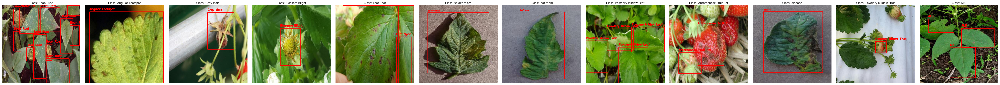

In [ ]:
#@title Visualize
%matplotlib inline
import os
import cv2
import matplotlib.pyplot as plt

# Paths from your data.yaml
classes = [
    "ALS", "Angular Leafspot", "Anthracnose Fruit Rot", "Bean Rust", "Blossom Blight",
    "Gray Mold", "Leaf Spot", "Powdery Mildew Fruit", "Powdery Mildew Leaf",
    "disease", "leaf mold", "spider mites"
]
image_dir = "/home/farhan/Workspace/VISKOM/Detecting-diseases-3/train/images"
label_dir = image_dir.replace("images", "labels")  # Assuming annotations are in a 'labels' folder

# Function to convert YOLO format to bounding box coordinates
def yolo_to_bbox(annotation, img_width, img_height):
    class_id, x_center, y_center, width, height = annotation
    x_min = int((x_center - width / 2) * img_width)
    y_min = int((y_center - height / 2) * img_height)
    x_max = int((x_center + width / 2) * img_width)
    y_max = int((y_center + height / 2) * img_height)
    return int(class_id), x_min, y_min, x_max, y_max

# Function to visualize class samples
def visualize_class_samples_horizontal(image_dir, label_dir, classes):
    """Visualize at least one image for each class in a horizontal row."""
    class_found = set()
    images_to_display = []  # List to store images for horizontal display
    titles = []  # Titles for each image

    for label_file in os.listdir(label_dir):
        # Parse label file
        with open(os.path.join(label_dir, label_file), "r") as f:
            annotations = [list(map(float, line.strip().split())) for line in f.readlines()]

        # Map annotations to class
        for ann in annotations:
            class_id = int(ann[0])  # Ensure class_id is an integer
            if class_id not in class_found:
                class_found.add(class_id)

                # Load corresponding image
                image_path = os.path.join(image_dir, label_file.replace(".txt", ".jpg"))
                img = cv2.imread(image_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img_height, img_width, _ = img.shape

                # Draw bounding boxes
                for bbox in annotations:
                    class_id, x_min, y_min, x_max, y_max = yolo_to_bbox(bbox, img_width, img_height)
                    color = (255, 0, 0)  # Red color for bounding boxes
                    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
                    cv2.putText(img, classes[class_id], (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                # Store the image and title
                images_to_display.append(img)
                titles.append(f"Class: {classes[class_id]}")

                # Stop if all classes are found
                if len(class_found) == len(classes):
                    break

    # Display all images horizontally
    n_images = len(images_to_display)
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 5, 5))  # Adjust width scaling
    for ax, img, title in zip(axes, images_to_display, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# Call the function
visualize_class_samples_horizontal(image_dir, label_dir, classes)


# YOLOv11

In [ ]:
#@title Train YOLOv11 using COCO-pretrained YOLO11n model

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolo11s.pt")

#@markdown Hyperparameter
epochs = 100 #@param {type:"integer"}
batch = 16 #@param {type:"integer"}
optimizer = 'auto' #@param {type:"string"}
imgsz = 640 #@param {type:"integer"}

# Train the model on the Custom dataset for 50 epochs
results = model.train(data=f'{dataset.location}/data.yaml', epochs=epochs,batch=batch , optimizer=optimizer, imgsz=imgsz, plots=True, device=0)

New https://pypi.org/project/ultralytics/8.3.54 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.49 🚀 Python-3.12.8 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/home/farhan/Workspace/VISKOM/Detecting-diseases-3/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks

train: Scanning /home/farhan/Workspace/VISKOM/Detecting-diseases-3/train/labels.cache... 3848 images, 0 backgrounds, 0 c
val: Scanning /home/farhan/Workspace/VISKOM/Detecting-diseases-3/valid/labels.cache... 551 images, 0 backgrounds, 0 corr


Plotting labels to runs/detect/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train10
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.28G      1.045      2.443      1.432         48        640: 100%|██████████| 241/241 [00:44<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.666      0.665      0.698      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.34G      1.032      1.432      1.378         33        640: 100%|██████████| 241/241 [00:40<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.686      0.652      0.708      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.38G      1.055      1.354      1.397         19        640: 100%|██████████| 241/241 [00:40<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.611      0.627      0.621      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.37G      1.037      1.264      1.382         29        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.591      0.733      0.737      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.38G      1.013      1.234       1.36         33        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.706      0.698      0.727      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.35G     0.9689      1.127      1.333         29        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.735      0.757      0.789      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.38G     0.9444      1.086      1.319         34        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278        0.8      0.763      0.823      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       4.4G     0.9374      1.044      1.313         34        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.812      0.788      0.841       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.37G     0.9109      1.001      1.289         36        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.806      0.796      0.852      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.34G     0.8971     0.9604      1.278         42        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.832      0.782      0.851      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.38G     0.8736      0.929      1.265         31        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.791      0.801      0.835      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       4.4G     0.8851     0.9403      1.269         46        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.835      0.784      0.845      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.37G     0.8717     0.9061      1.263         44        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.851      0.839      0.885      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.34G     0.8554     0.8835      1.248         31        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.852      0.827      0.879      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.38G     0.8557     0.8558      1.251         26        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.854      0.821      0.879      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.36G     0.8431     0.8577      1.241         33        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.83      0.835      0.875       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.38G     0.8302     0.8377      1.234         22        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.875      0.815      0.883      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.35G     0.8278     0.8306      1.235         28        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.86      0.841      0.893      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.38G     0.8231     0.8096      1.223         28        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.849      0.815      0.874      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.38G     0.8137     0.7947      1.215         32        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.851      0.861      0.889      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.38G     0.8016     0.7784      1.214         27        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278      0.895      0.828      0.901      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.34G     0.7887     0.7709      1.199         51        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.88      0.863      0.909      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.38G     0.7925     0.7653      1.204         26        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278      0.873       0.87      0.911      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.37G     0.7804     0.7526      1.199         38        640: 100%|██████████| 241/241 [00:42<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.868       0.86      0.906      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.36G     0.7809     0.7499      1.195         26        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.883      0.864      0.908      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.35G     0.7751      0.734      1.191         39        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278        0.9      0.862      0.911      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.38G     0.7636     0.7219      1.184         34        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.872      0.873      0.912      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.38G     0.7637     0.7121      1.184         49        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.916      0.875      0.924      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.36G     0.7645     0.7117      1.174         29        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.87      0.887      0.916      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.34G     0.7564     0.6974       1.17         27        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.907      0.875      0.916       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.37G     0.7511     0.6946      1.169         23        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.889      0.873      0.912      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.39G     0.7494     0.6914      1.167         44        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.875      0.856       0.91      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.38G      0.744     0.6748      1.167         34        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.887      0.881       0.92      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.34G     0.7329     0.6672      1.156         41        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.892      0.884      0.926      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       4.4G     0.7402     0.6714      1.157         32        640: 100%|██████████| 241/241 [00:40<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.911      0.868      0.928      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.38G     0.7254     0.6564      1.155         44        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.898      0.879      0.918       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.37G     0.7285      0.654      1.164         31        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.891      0.887       0.92      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.33G     0.7177     0.6474      1.154         50        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.907      0.886      0.923      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.38G      0.713     0.6405      1.147         29        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.898      0.882      0.923       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.39G     0.7045     0.6339      1.138         32        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.908      0.882      0.924      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.37G     0.7092     0.6333      1.144         38        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.899      0.895      0.929      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.34G     0.7076     0.6156      1.142         38        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.913      0.888      0.934      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.39G     0.6968     0.6178      1.134         30        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278      0.891      0.889      0.928      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.37G     0.7004     0.6194      1.138         33        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.897      0.901      0.933      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.39G     0.6923     0.5958      1.133         39        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.92      0.877      0.932      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.35G     0.6901     0.5902       1.13         53        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.91      0.903      0.936      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.39G     0.6896     0.5915      1.129         44        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.908      0.895      0.933      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.37G     0.6842     0.5945      1.126         31        640: 100%|██████████| 241/241 [00:40<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.912      0.898      0.939       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.38G     0.6778     0.5787      1.125         44        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.915      0.904      0.943      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.35G     0.6731     0.5772      1.119         46        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.926      0.894      0.943      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.38G     0.6775     0.5676      1.123         27        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.927      0.908      0.946      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.37G     0.6725     0.5648      1.118         24        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.926      0.893      0.938      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.37G     0.6652     0.5726      1.112         41        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.902      0.899      0.934      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.35G     0.6625      0.564      1.111         26        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.926      0.908      0.944      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.39G     0.6563     0.5567      1.106         35        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.917      0.912      0.946      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.38G     0.6531     0.5371      1.105         32        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278      0.907      0.905      0.935      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.37G     0.6529     0.5541      1.106         29        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.924      0.907      0.942      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.34G     0.6459     0.5417      1.103         28        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.907      0.908       0.94      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.37G     0.6382     0.5204      1.095         23        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.921      0.905      0.943      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.37G     0.6452     0.5362      1.102         27        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278       0.92      0.894      0.938      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.37G     0.6439     0.5325      1.096         26        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.913      0.906      0.941      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.35G     0.6372     0.5252      1.096         37        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.917      0.894      0.937      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.39G     0.6335     0.5127      1.091         39        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.916      0.903      0.939      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.39G     0.6219     0.5041      1.087         25        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.91      0.916      0.941      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.37G     0.6281     0.5137      1.089         48        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.918      0.914      0.946      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.35G     0.6324     0.5078      1.088         34        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.908      0.933      0.947      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.39G     0.6269     0.5087       1.09         38        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.927      0.898      0.938      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.38G      0.619     0.5043      1.082         44        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.937        0.9      0.946      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.38G      0.616     0.4945      1.077         33        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278      0.934      0.896      0.941      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.35G     0.5953      0.479      1.068         25        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.931      0.901      0.944       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.38G     0.6174     0.4878      1.084         25        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.925      0.907      0.943      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.37G      0.606     0.4748      1.071         36        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.923      0.915      0.945      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.38G      0.609     0.4823      1.079         37        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.929      0.908      0.948      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.34G     0.5982     0.4711      1.066         31        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.929      0.914      0.944      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.38G     0.5893     0.4648      1.064         34        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.938      0.914      0.946      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.37G     0.5902     0.4536       1.06         47        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.927      0.922      0.951      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.37G      0.588     0.4595      1.068         49        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.927      0.913      0.946      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.35G     0.5836     0.4494      1.061         48        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.93      0.915      0.948       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.37G     0.5859     0.4558      1.064         26        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.937      0.916      0.945      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.37G     0.5854     0.4566      1.059         39        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.921      0.925      0.946      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.39G      0.581     0.4485      1.057         30        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.917      0.925      0.946      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.34G      0.573     0.4402      1.056         35        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<

                   all        551       1278      0.928       0.92      0.947      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.38G     0.5783     0.4479      1.055         23        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.913      0.915      0.946      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.37G     0.5797     0.4431      1.053         42        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.939      0.903      0.946       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.39G     0.5601     0.4296      1.049         43        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.935      0.908      0.945      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.33G     0.5656     0.4322      1.052         32        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.94      0.905      0.944      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.38G     0.5626     0.4286      1.053         25        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.948      0.903      0.946      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.38G     0.5596     0.4235      1.046         30        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.943      0.911      0.947      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.37G     0.5573      0.422      1.047         45        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.925      0.917      0.946      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.33G     0.5603     0.4227      1.042         30        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.926      0.911      0.946      0.822


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.36G     0.4681     0.3235     0.9798         16        640: 100%|██████████| 241/241 [00:41<00:00,  5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.94      0.904      0.944      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.38G     0.4587     0.3249     0.9781         17        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.933      0.917      0.947      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.36G     0.4489     0.3039     0.9689         19        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278       0.93      0.916      0.947      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.34G     0.4486     0.3062     0.9687         26        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.941      0.898      0.947      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.38G     0.4444     0.3035     0.9679         20        640: 100%|██████████| 241/241 [00:36<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.932      0.906      0.944      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      4.37G     0.4446     0.2994     0.9688         25        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<

                   all        551       1278       0.94      0.902      0.944      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.36G     0.4366     0.2926     0.9576         13        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.933      0.908      0.946      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.33G     0.4317     0.2874      0.957         16        640: 100%|██████████| 241/241 [00:37<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.931      0.907      0.945      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.36G     0.4282     0.2854     0.9539         16        640: 100%|██████████| 241/241 [00:38<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<

                   all        551       1278      0.932      0.909      0.947      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.38G     0.4276     0.2887      0.955         18        640: 100%|██████████| 241/241 [00:39<00:00,  6
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<

                   all        551       1278      0.926      0.915      0.946      0.825



100 epochs completed in 1.172 hours.
Optimizer stripped from runs/detect/train10/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train10/weights/best.pt, 19.2MB

Validating runs/detect/train10/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.12.8 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
YOLO11s summary (fused): 238 layers, 9,417,444 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<


                   all        551       1278      0.938        0.9      0.947      0.828
                   ALS         26         98      0.824      0.671      0.767      0.511
      Angular Leafspot         63         77      0.903      0.987      0.984      0.924
 Anthracnose Fruit Rot         19         30      0.938      0.933      0.964      0.789
             Bean Rust         29        142        0.8      0.803      0.874      0.626
        Blossom Blight         41         64      0.993          1      0.995      0.906
             Gray Mold         80         84      0.951      0.933      0.976      0.815
             Leaf Spot         86        348      0.967      0.852      0.946      0.891
  Powdery Mildew Fruit         33         62      0.982      0.872      0.969      0.897
   Powdery Mildew Leaf         60        257      0.937      0.833      0.933      0.846
               disease         43         43      0.975      0.918      0.963      0.843
             leaf mol

# Evaluation

## Train

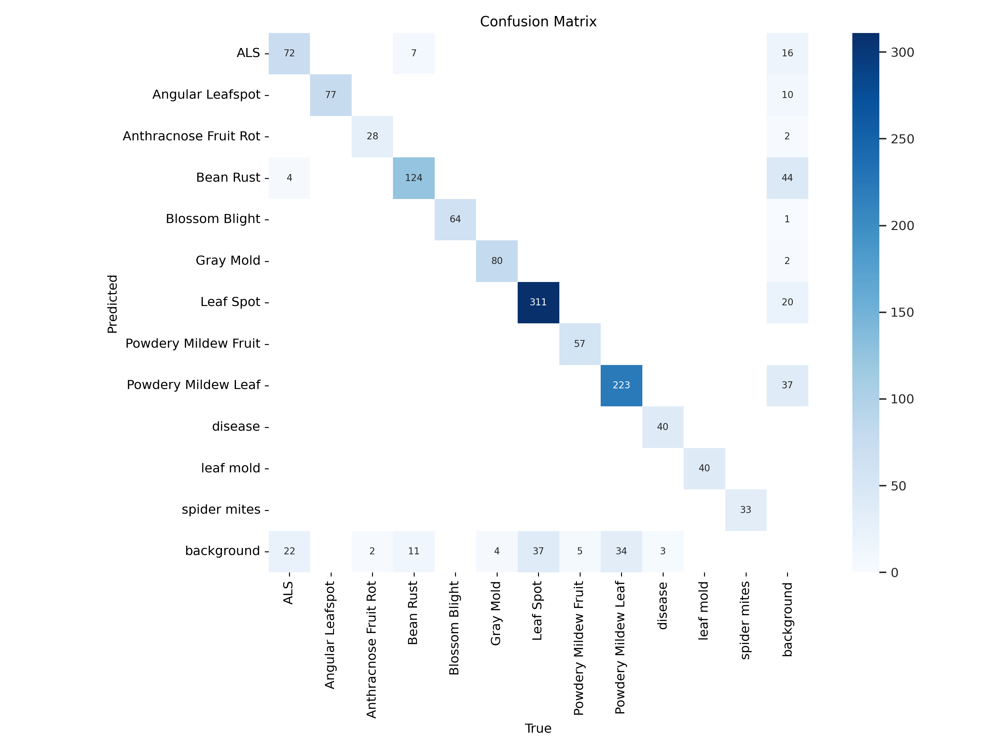

In [ ]:
#@title Confusion Matrix
from IPython.display import Image, display

image_path = "runs/detect/train10/confusion_matrix.png"
display(Image(filename=image_path, width=1000))

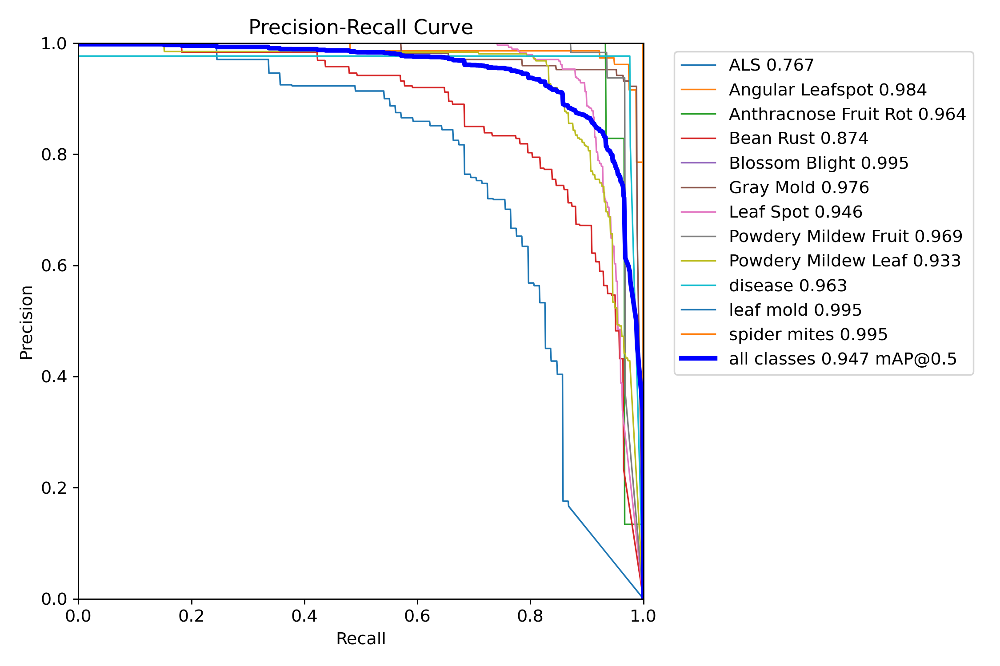

In [ ]:
#@title Precision-Recall Curve
from IPython.display import Image, display

image_path = "runs/detect/train10/PR_curve.png"
display(Image(filename=image_path, width=1000))

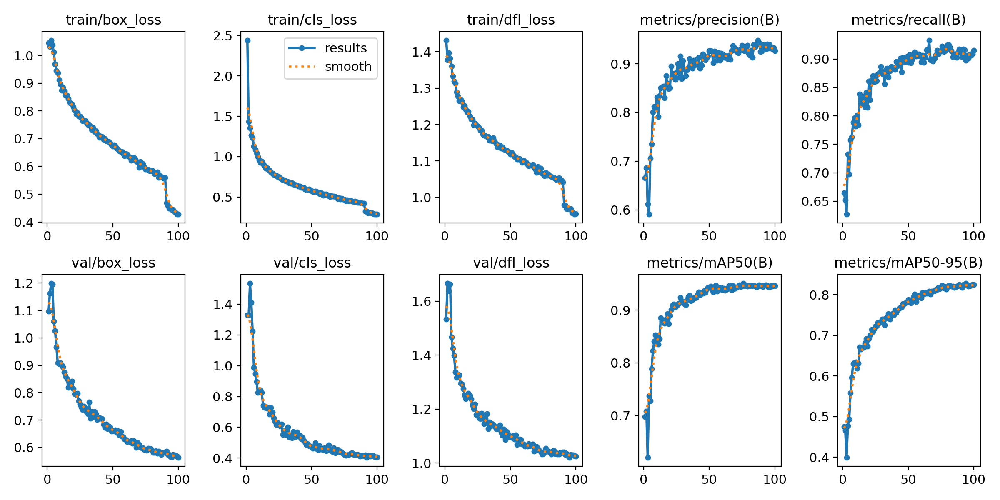

In [ ]:
#@title Training Performance (Plot)
from IPython.display import Image, display

image_path = "runs/detect/train10/results.png"
display(Image(filename=image_path, width=1000))

In [ ]:
#@title Training Performance (Table)
import pandas as pd
df = pd.read_csv("runs/detect/train10/results.csv")
df

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,48.4599,1.04549,2.44279,1.43152,0.66567,0.66489,0.69771,0.47483,1.09661,1.32790,1.53334,0.000207,0.000207,0.000207
1,2,93.0185,1.03173,1.43174,1.37779,0.68576,0.65191,0.70808,0.46562,1.16219,1.32928,1.66585,0.000412,0.000412,0.000412
2,3,138.0040,1.05482,1.35369,1.39713,0.61147,0.62703,0.62059,0.39932,1.19909,1.53421,1.63749,0.000612,0.000612,0.000612
3,4,181.2030,1.03712,1.26351,1.38178,0.59090,0.73290,0.73733,0.47717,1.19569,1.40897,1.66318,0.000606,0.000606,0.000606
4,5,225.1320,1.01276,1.23411,1.36050,0.70612,0.69754,0.72743,0.49335,1.06013,1.22352,1.46723,0.000600,0.000600,0.000600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,4048.3500,0.44456,0.29944,0.96878,0.93969,0.90154,0.94395,0.82073,0.57437,0.41739,1.03127,0.000037,0.000037,0.000037
96,97,4089.1200,0.43656,0.29261,0.95762,0.93263,0.90849,0.94620,0.82124,0.57283,0.41417,1.02979,0.000031,0.000031,0.000031
97,98,4129.9000,0.43171,0.28743,0.95702,0.93075,0.90664,0.94522,0.82381,0.57060,0.40805,1.02892,0.000025,0.000025,0.000025
98,99,4172.9200,0.42819,0.28538,0.95394,0.93235,0.90919,0.94693,0.82458,0.56731,0.40630,1.02603,0.000019,0.000019,0.000019


In [ ]:
#@title Best Result
import pandas as pd

# Load the CSV file
df = pd.read_csv("runs/detect/train10/results.csv")

# Display only row 50 (Python's zero-based indexing: row 49)
row_50 = df.iloc[[df['metrics/mAP50-95(B)'].idxmax()]]  # Double brackets to keep it as a DataFrame

# Show the result
row_50

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
93,94,3965.5,0.44857,0.3062,0.96866,0.94052,0.89769,0.94683,0.82782,0.56586,0.41438,1.02431,0.00005,0.00005,0.00005


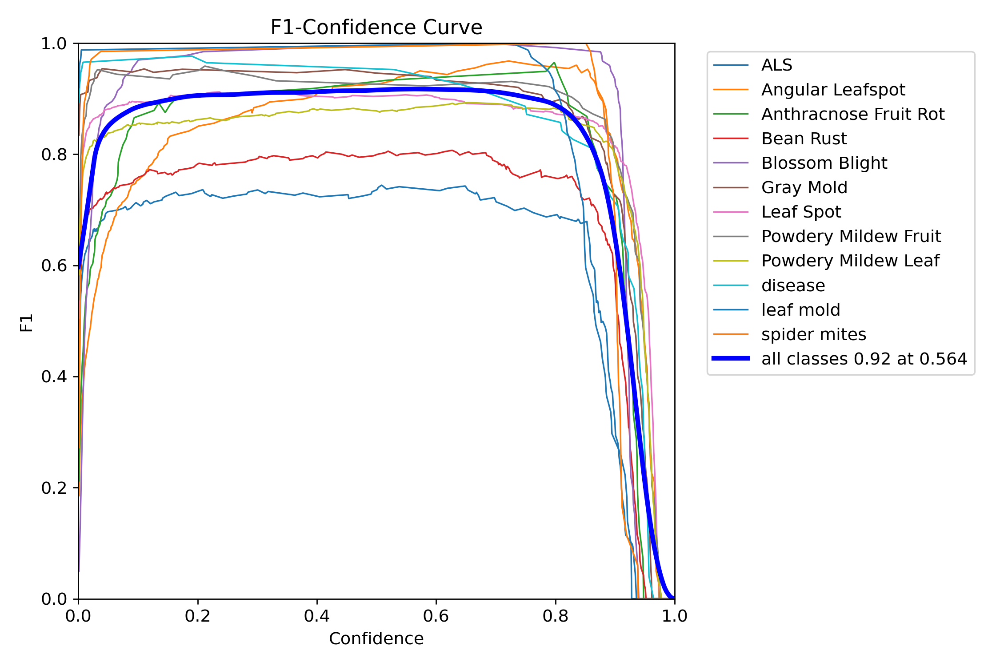

In [ ]:
#@title F1 Confidence Curve
from IPython.display import Image, display

image_path = "runs/detect/train10/F1_curve.png"
display(Image(filename=image_path, width=1000))

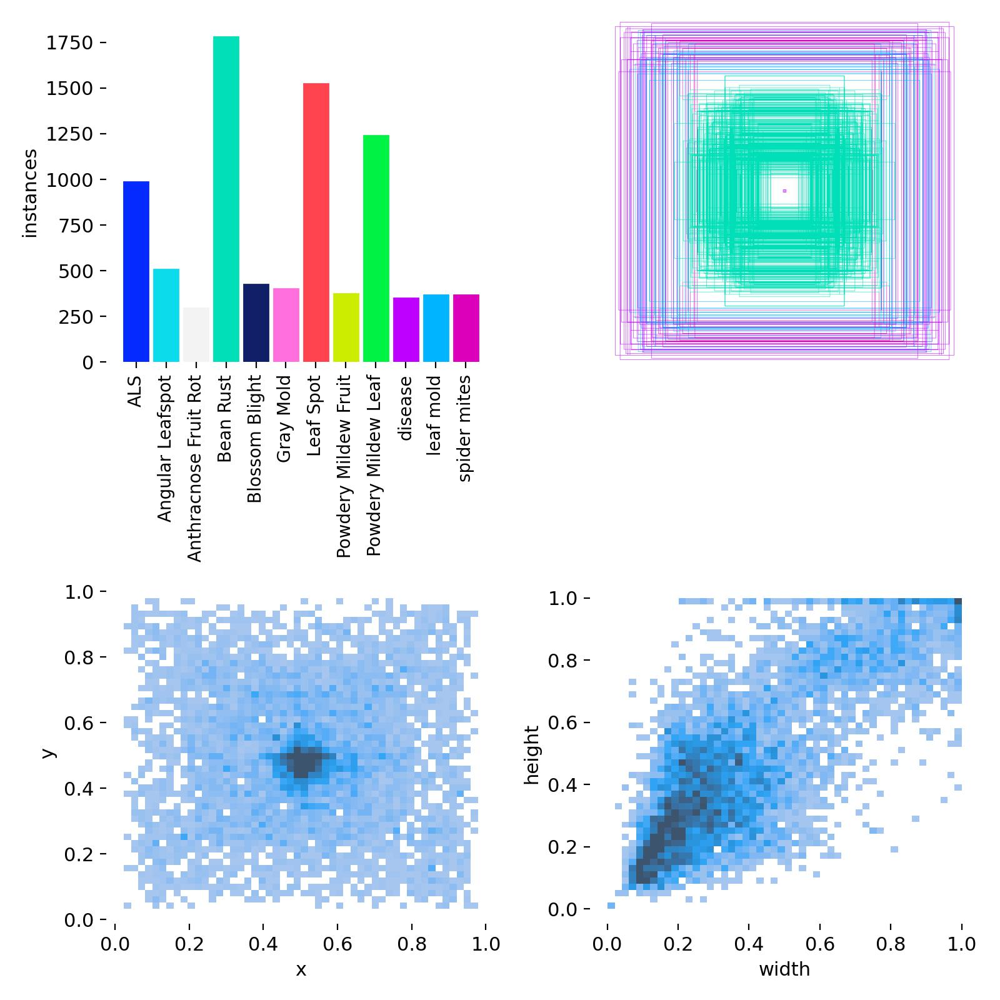

In [ ]:
#@title Labels
from IPython.display import Image, display

image_path = "runs/detect/train10/labels.jpg"
display(Image(filename=image_path, width=1000))

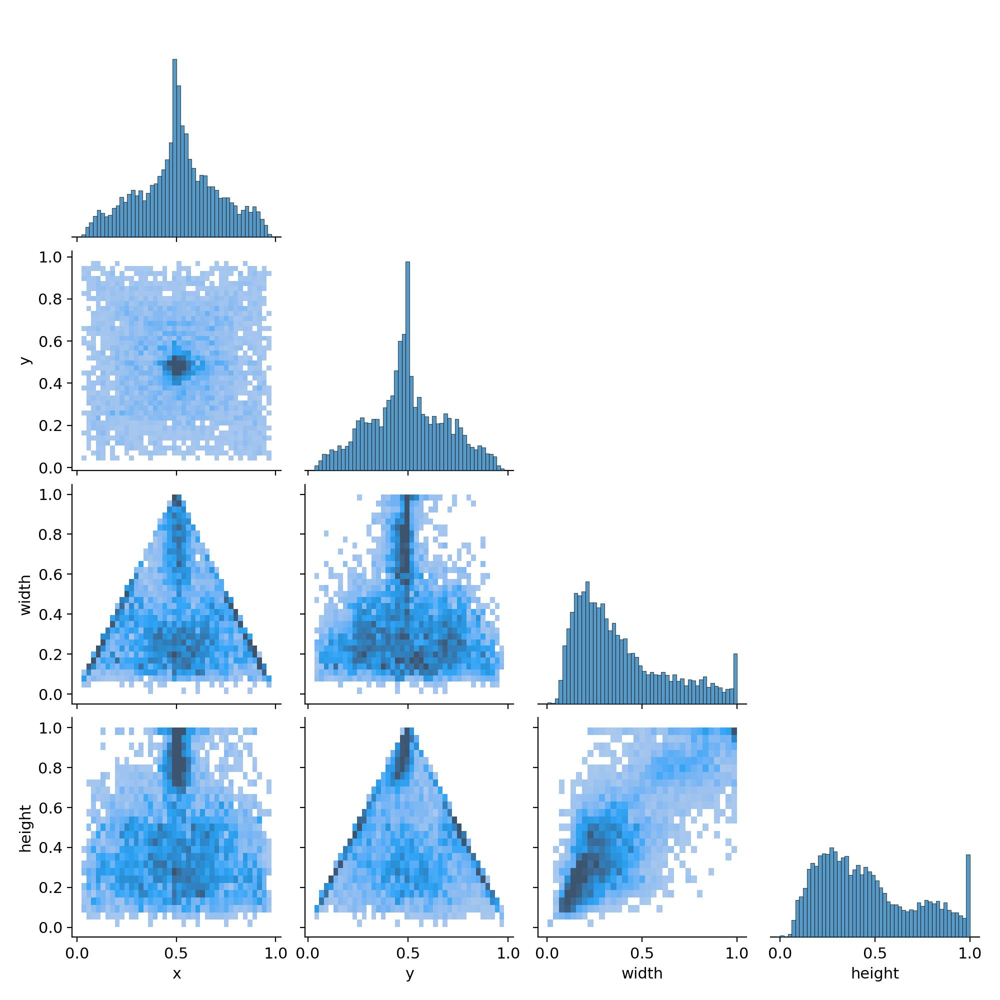

In [ ]:
#@title Labels Correlogram
from IPython.display import Image, display

image_path = "runs/detect/train10/labels_correlogram.jpg"
display(Image(filename=image_path, width=1000))

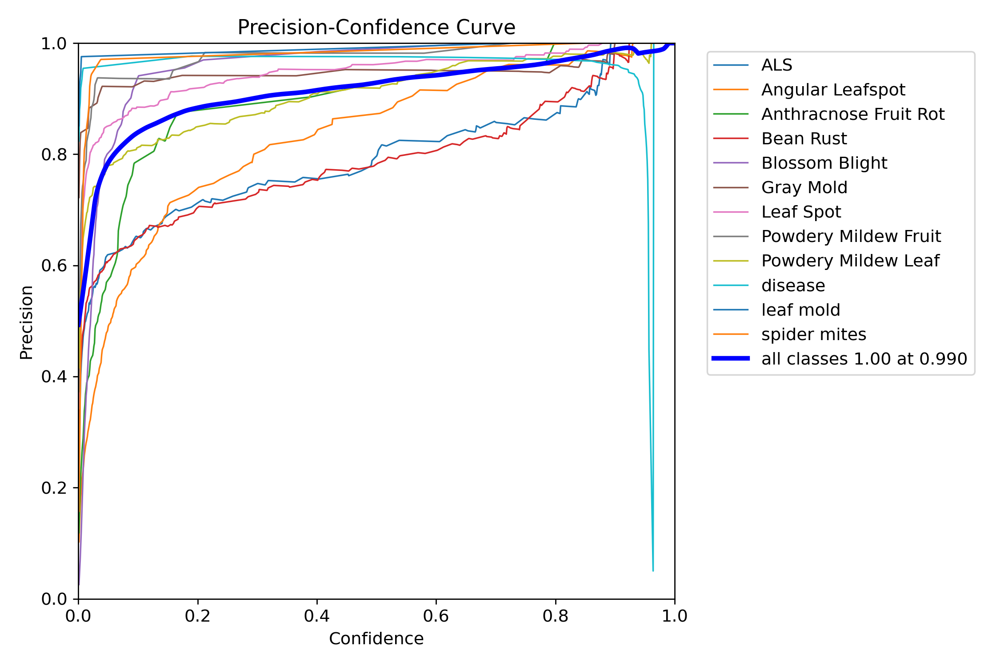

In [ ]:
#@title Precision-Confidence Curve
from IPython.display import Image, display

image_path = "runs/detect/train10/P_curve.png"
display(Image(filename=image_path, width=1000))

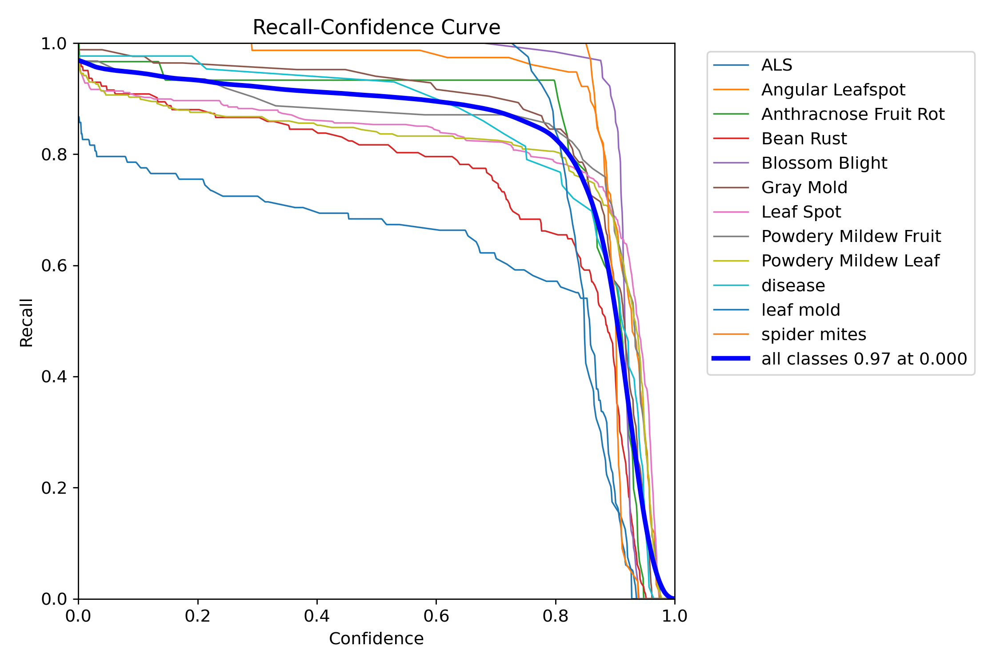

In [ ]:
#@title Recall-Confidence Curve
from IPython.display import Image, display

image_path = "runs/detect/train10/R_curve.png"
display(Image(filename=image_path, width=1000))

## Test

In [ ]:
#@title Use Testing dataset for Testing
# Rubah path pada file data.yaml di dataset

# Path to your data.yaml file
yaml_file = f'{dataset.location}/data.yaml'

# New paths for train, val, and test
new_train_path = f'{dataset.location}/train/images'
new_val_path = f'{dataset.location}/test/images'
new_test_path = f'{dataset.location}/test/images'

# Read the data.yaml file
with open(yaml_file, 'r') as file:
    data = yaml.safe_load(file)

# Modify the paths
data['train'] = new_train_path
data['val'] = new_val_path
data['test'] = new_test_path

# Write the modified data back to the file
with open(yaml_file, 'w') as file:
    yaml.safe_dump(data, file)

print("Paths have been updated successfully.")

Paths have been updated successfully.


In [ ]:
#@title Evaluate model performance on the test set (Testing)
metrics = model.val(data=f'{dataset.location}/data.yaml')

Ultralytics 8.3.49 🚀 Python-3.12.8 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
YOLO11s summary (fused): 238 layers, 9,417,444 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /home/farhan/Workspace/VISKOM/Detecting-diseases-3/test/labels.cache... 1093 images, 0 backgrounds, 0 corr
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:09<


                   all       1093       2370      0.945      0.904      0.946      0.822
                   ALS         86        294       0.84      0.714      0.819      0.544
      Angular Leafspot        110        130       0.97      0.977      0.988      0.905
 Anthracnose Fruit Rot         41         57      0.974      0.825      0.873      0.698
             Bean Rust         93        436      0.824      0.851      0.911      0.706
        Blossom Blight         86        140      0.993       0.96       0.97      0.845
             Gray Mold        117        136      0.984      0.911      0.978      0.753
             Leaf Spot        116        419      0.973      0.936      0.983      0.943
  Powdery Mildew Fruit         63        126      0.949      0.879      0.967      0.869
   Powdery Mildew Leaf        116        363      0.894      0.855       0.92      0.853
               disease         99        100       0.99      0.967      0.984      0.916
             leaf mol

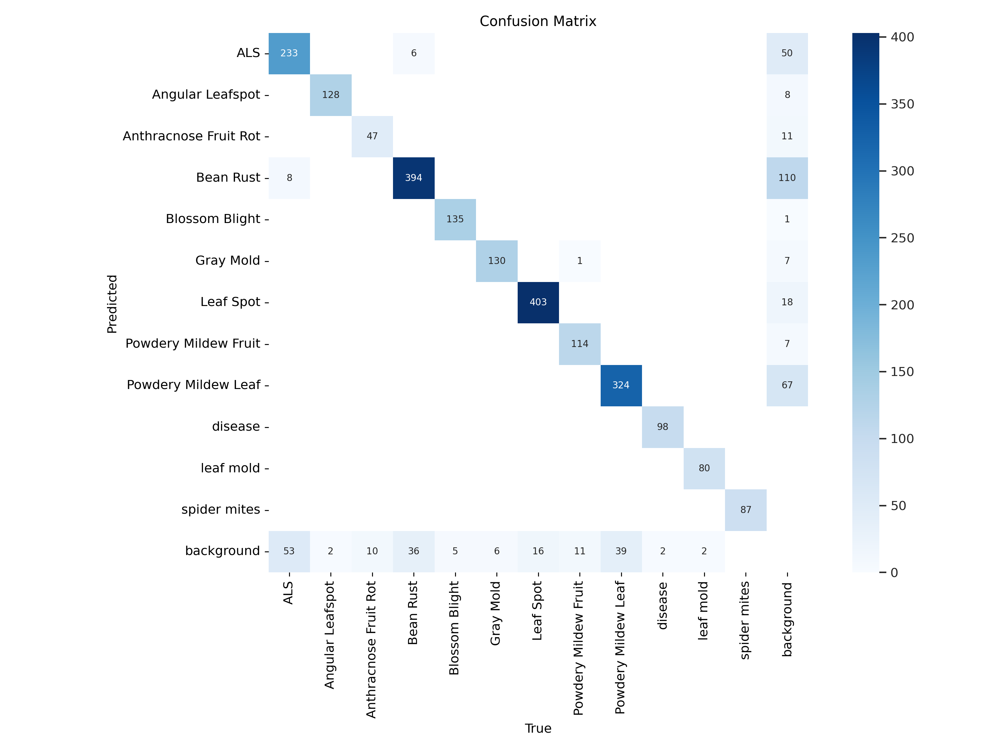

In [ ]:
#@title Confusion Matrix
from IPython.display import Image, display

image_path = "runs/detect/train102/confusion_matrix.png"
display(Image(filename=image_path, width=1000))

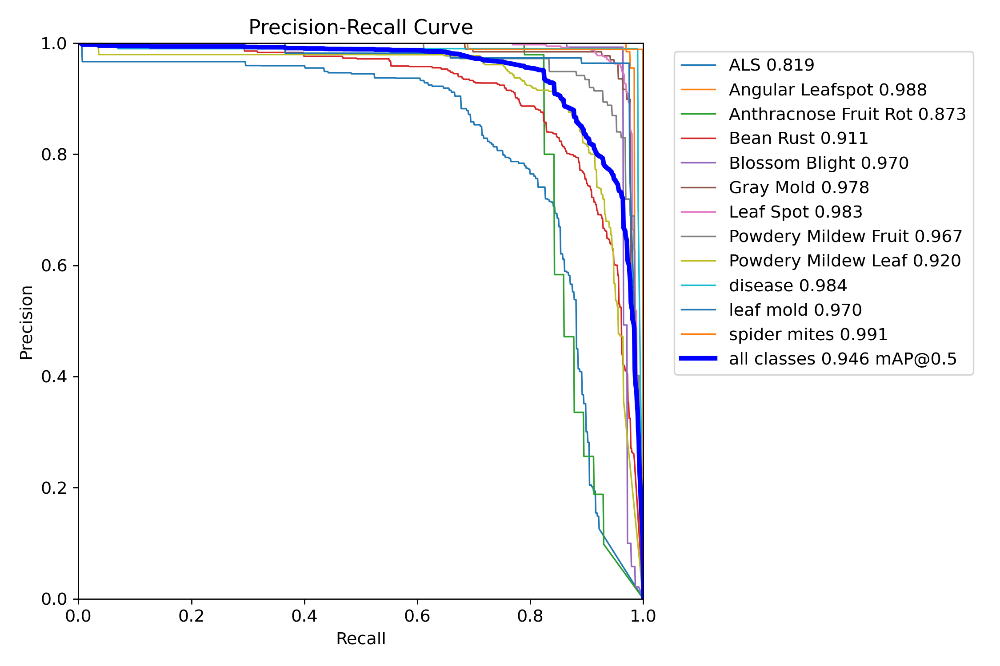

In [ ]:
#@title Precision-Recall Curve
from IPython.display import Image, display

image_path = "runs/detect/train102/PR_curve.png"
display(Image(filename=image_path, width=1000))

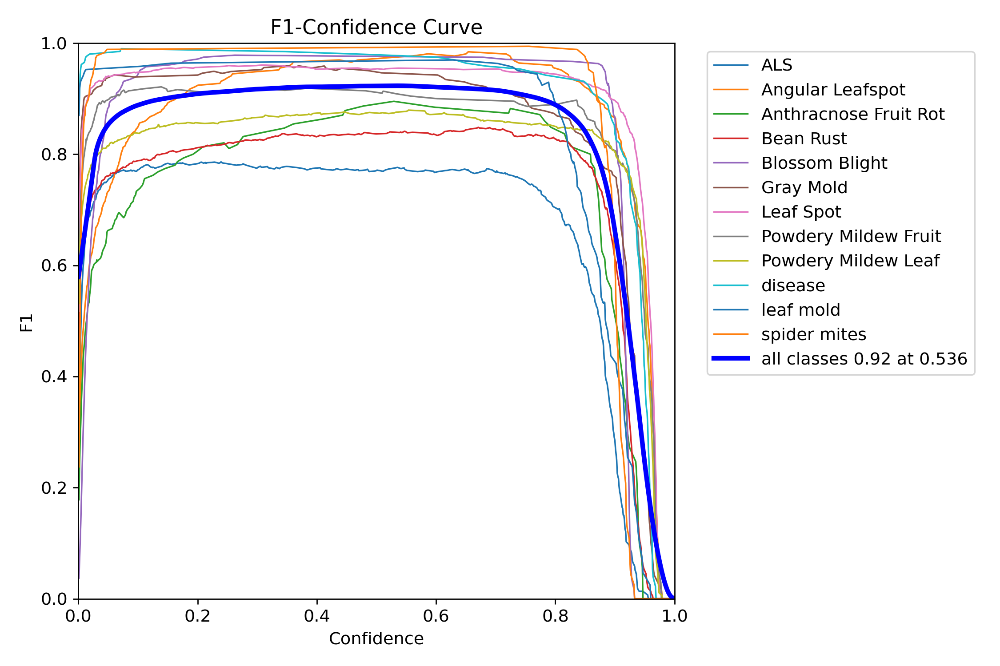

In [ ]:
#@title F1 Confidence Curve
from IPython.display import Image, display

image_path = "runs/detect/train102/F1_curve.png"
display(Image(filename=image_path, width=1000))

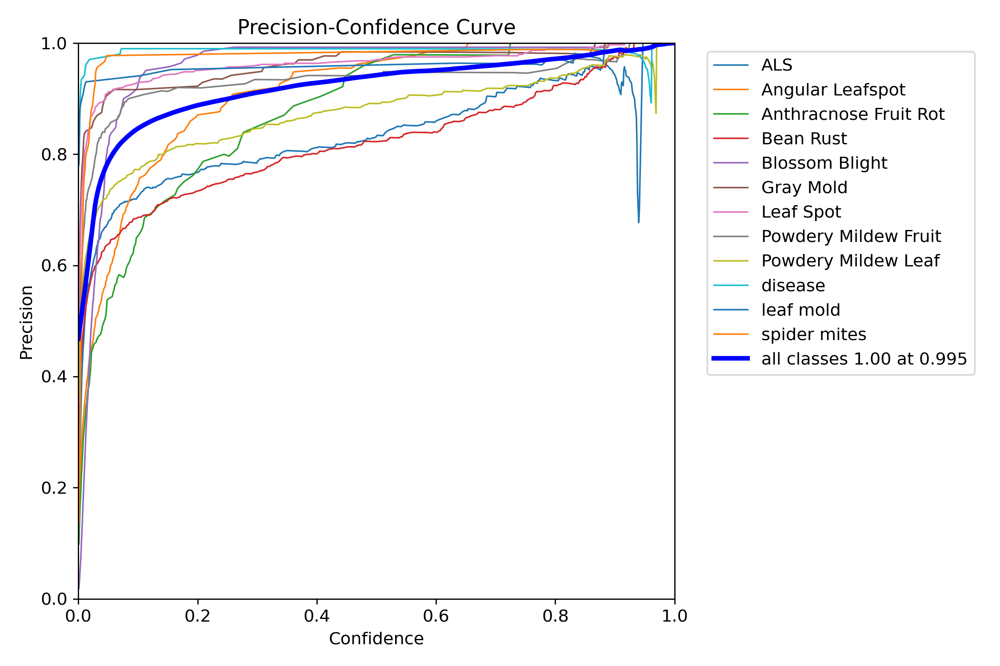

In [ ]:
#@title Precision-Confidence Curve
from IPython.display import Image, display

image_path = "runs/detect/train102/P_curve.png"
display(Image(filename=image_path, width=1000))

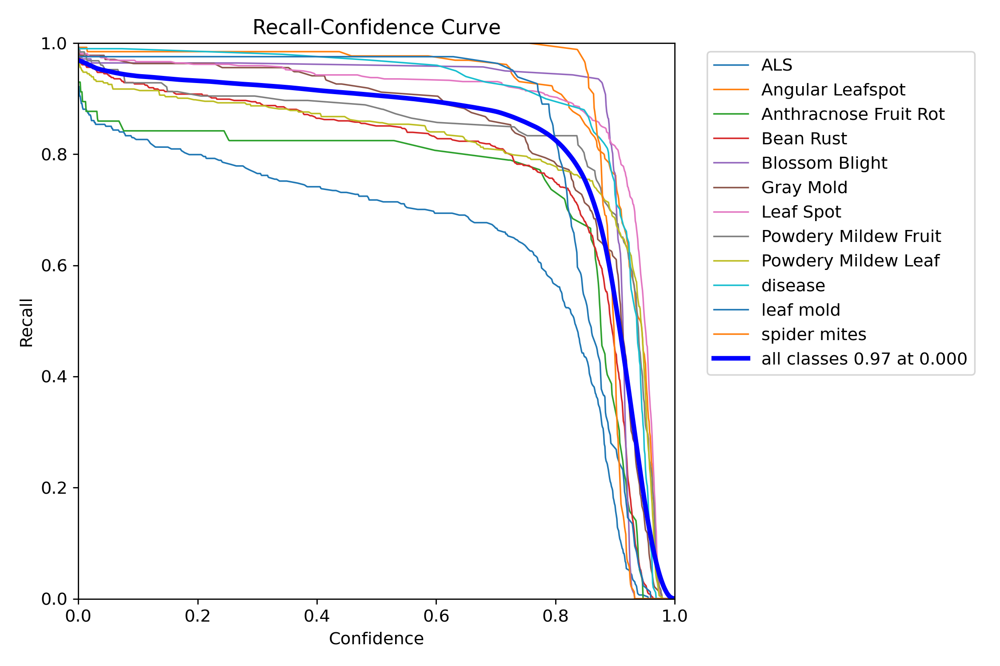

In [ ]:
#@title Recall-Confidence Curve
from IPython.display import Image, display

image_path = "runs/detect/train102/R_curve.png"
display(Image(filename=image_path, width=1000))

# Predict

In [ ]:
#@title Perform object detection on an image
results = model("Testing Image/Tes.jpg")


image 1/1 /home/farhan/Workspace/VISKOM/Testing Image/Tes.jpg: 480x640 4 Leaf Spots, 65.6ms
Speed: 2.8ms preprocess, 65.6ms inference, 4.9ms postprocess per image at shape (1, 3, 480, 640)


Original


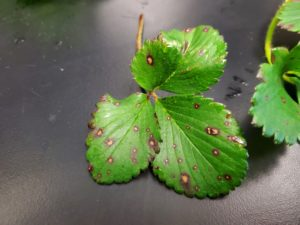

Detected


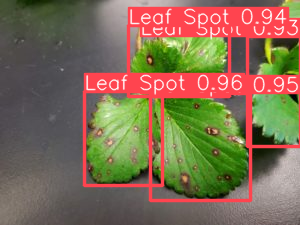

In [ ]:
#@title Result
image_path = "Testing Image/Tes.jpg"
print("Original")
display(Image(filename=image_path, width=300,height=225))
print("Detected")
results[0].show()

In [ ]:
#@title Deploy model in Roboflow

rf = Roboflow(api_key="NFACG7gKBTunlf3HY0DO")
project = rf.workspace("farhan-abdullah-yunus").project("detecting-diseases-f6j4d")

#can specify weights_filename, default is "weights/best.pt"
version = project.version(3)

#example1 - directory path is "training1/model1.pt" for yolov8 model
version.deploy("yolov11", "runs/detect/train10/weights", "best.pt")



loading Roboflow workspace...
loading Roboflow project...
View the status of your deployment at: https://app.roboflow.com/farhan-abdullah-yunus/detecting-diseases-f6j4d/3
Share your model with the world at: https://universe.roboflow.com/farhan-abdullah-yunus/detecting-diseases-f6j4d/model/3


Use model at below link


https://universe.roboflow.com/farhan-abdullah-yunus/detecting-diseases-f6j4d/model/3